In [2]:
import scanpy as sc
import loompy as lm
import scvelo as scv
import os
import pandas as pd
import numpy as np

/home/rzh/BCY/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/home/rzh/BCY/lib/python3.10/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/home/rzh/BCY/lib/python3.10/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currentl

In [8]:
preDict = ['1T','2T','3T','5N','5T','6N',
           '6T','8T','9T','10N','10T','12N','15T','16N',
           '17T','20T','21T','22T',
           ]

In [10]:
VeloPath='/data/BCY/BCY-velo/'
loomList = [VeloPath + v + '.loom' for v in preDict]
# lm.combine(loomList, output_file="preCombined.loom")
loomList

['/data/BCY/BCY-velo/1T.loom',
 '/data/BCY/BCY-velo/2T.loom',
 '/data/BCY/BCY-velo/3T.loom',
 '/data/BCY/BCY-velo/5N.loom',
 '/data/BCY/BCY-velo/5T.loom',
 '/data/BCY/BCY-velo/6N.loom',
 '/data/BCY/BCY-velo/6T.loom',
 '/data/BCY/BCY-velo/8T.loom',
 '/data/BCY/BCY-velo/9T.loom',
 '/data/BCY/BCY-velo/10N.loom',
 '/data/BCY/BCY-velo/10T.loom',
 '/data/BCY/BCY-velo/12N.loom',
 '/data/BCY/BCY-velo/15T.loom',
 '/data/BCY/BCY-velo/16N.loom',
 '/data/BCY/BCY-velo/17T.loom',
 '/data/BCY/BCY-velo/20T.loom',
 '/data/BCY/BCY-velo/21T.loom',
 '/data/BCY/BCY-velo/22T.loom']

In [14]:
lm.combine_faster(loomList, output_file="preFCombined.loom")

In [3]:
adata = sc.read_h5ad("adata-preF.h5ad")

In [43]:
bdata = sc.read_h5ad("BCM-Mye.h5ad")

In [52]:
bdata.obs_names

Index(['AAACCTGGTCTTGATG-1-BCM_HER2BC10_HRR177191',
       'AAACCTGTCTAGCACA-1-BCM_HER2BC10_HRR177191',
       'AAAGCAACAGATGGCA-1-BCM_HER2BC10_HRR177191',
       'AAAGCAATCTAACCGA-1-BCM_HER2BC10_HRR177191',
       'AAAGTAGGTGCAGTAG-1-BCM_HER2BC10_HRR177191',
       'AAATGCCGTCTGATTG-1-BCM_HER2BC10_HRR177191',
       'AACACGTGTCTCTCTG-1-BCM_HER2BC10_HRR177191',
       'AACACGTTCTACCAGA-1-BCM_HER2BC10_HRR177191',
       'AACCATGCACCAGCAC-1-BCM_HER2BC10_HRR177191',
       'AACCATGGTTATTCTC-1-BCM_HER2BC10_HRR177191',
       ...
       'TTTACTGGTCTCCATC-1-BCM_LABC8_HRR177181',
       'TTTACTGGTTCCATGA-1-BCM_LABC8_HRR177181',
       'TTTATGCAGGAGTACC-1-BCM_LABC8_HRR177181',
       'TTTATGCAGTAGGTGC-1-BCM_LABC8_HRR177181',
       'TTTATGCCAGTAGAGC-1-BCM_LABC8_HRR177181',
       'TTTGCGCCATCTGGTA-1-BCM_LABC8_HRR177181',
       'TTTGCGCTCTAACCGA-1-BCM_LABC8_HRR177181',
       'TTTGGTTTCACCATAG-1-BCM_LABC8_HRR177181',
       'TTTGTCAGTCTCACCT-1-BCM_LABC8_HRR177181',
       'TTTGTCAGTGCTCTTC-1-B

In [15]:
ldata = scv.read_loom('preFCombined.loom')
ldata.obs_names

Index(['LC_1T:AAACCCATCGAGTGAGx', 'LC_1T:AAACCCATCACTTTGTx',
       'LC_1T:AAATGGAAGTCGCTATx', 'LC_1T:AAAGAACGTCGAGTGAx',
       'LC_1T:AAAGTCCTCCCTAGGGx', 'LC_1T:AAACGAACATAGAATGx',
       'LC_1T:AAAGGGCCATCGATACx', 'LC_1T:AAAGTCCCACGACTATx',
       'LC_1T:AAAGGTAAGCCTGCCAx', 'LC_1T:AAAGAACAGACGACGTx',
       ...
       'LC_22T:TTTCCTCTCTGGGCCAx', 'LC_22T:TTTGCGCTCACCAGGCx',
       'LC_22T:TTTGTCATCTGGCGACx', 'LC_22T:TTTGCGCAGTGACATAx',
       'LC_22T:TTTGTCATCAGTCAGTx', 'LC_22T:TTTGGTTCAAATCCGTx',
       'LC_22T:TTTGCGCAGAGGTACCx', 'LC_22T:TTTCCTCCAGGATCGAx',
       'LC_22T:TTTCCTCTCGTCGTTCx', 'LC_22T:TTTGCGCCATTTCACTx'],
      dtype='object', name='CellID', length=195199)

In [44]:
mdata = scv.read_loom('BCMCombined.loom')
mdata.obs_names

Index(['BCM_HER2BC10_HRR177191:AAAGATGAGGCAAAGAx',
       'BCM_HER2BC10_HRR177191:AAAGCAATCTAACCGAx',
       'BCM_HER2BC10_HRR177191:AAATGCCTCAGGTAAAx',
       'BCM_HER2BC10_HRR177191:AAATGCCGTCTGATTGx',
       'BCM_HER2BC10_HRR177191:AACACGTCAAGTACCTx',
       'BCM_HER2BC10_HRR177191:AAACGGGTCTCACATTx',
       'BCM_HER2BC10_HRR177191:AACACGTCACCGATATx',
       'BCM_HER2BC10_HRR177191:AAACCTGCAGTCACTAx',
       'BCM_HER2BC10_HRR177191:AACACGTAGGCCGAATx',
       'BCM_HER2BC10_HRR177191:AAAGTAGTCACAGTACx',
       ...
       'BCM_TNBC6_HRR177174:TTTGTCATCTAACTCTx',
       'BCM_TNBC6_HRR177174:TTTGTCAGTTAGATGAx',
       'BCM_TNBC6_HRR177174:TTTGTCAGTGTTGAGGx',
       'BCM_TNBC6_HRR177174:TTTGTCAGTTCTCATTx',
       'BCM_TNBC6_HRR177174:TTTGTCATCCTCCTAGx',
       'BCM_TNBC6_HRR177174:TTTGTCATCTATCGCCx',
       'BCM_TNBC6_HRR177174:TTTGTCATCACATACGx',
       'BCM_TNBC6_HRR177174:TTTGTCATCCTAGGGCx',
       'BCM_TNBC6_HRR177174:TTTGTCATCATCGGATx',
       'BCM_TNBC6_HRR177174:TTTGTCATCAGTCCCTx']

In [58]:
mdata

AnnData object with n_obs × n_vars = 226957 × 33538
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [59]:
mnames = mdata.obs_names
mname = [s.split(':')[1].split('x')[0]+ '-1-'+ s.split(':')[0] for s in mnames]
mdata.obs_names = mname
mdata.obs_names

Exception ignored in: <function _xla_gc_callback at 0x7f7796127d00>
Traceback (most recent call last):
  File "/home/rzh/BCY/lib/python3.10/site-packages/jax/_src/lib/__init__.py", line 97, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


IndexError: list index out of range

In [60]:
mdata.obs_names

Index(['AAAGATGAGGCAAAGA-1-BCM_HER2BC10_HRR177191',
       'AAAGCAATCTAACCGA-1-BCM_HER2BC10_HRR177191',
       'AAATGCCTCAGGTAAA-1-BCM_HER2BC10_HRR177191',
       'AAATGCCGTCTGATTG-1-BCM_HER2BC10_HRR177191',
       'AACACGTCAAGTACCT-1-BCM_HER2BC10_HRR177191',
       'AAACGGGTCTCACATT-1-BCM_HER2BC10_HRR177191',
       'AACACGTCACCGATAT-1-BCM_HER2BC10_HRR177191',
       'AAACCTGCAGTCACTA-1-BCM_HER2BC10_HRR177191',
       'AACACGTAGGCCGAAT-1-BCM_HER2BC10_HRR177191',
       'AAAGTAGTCACAGTAC-1-BCM_HER2BC10_HRR177191',
       ...
       'TTTGTCATCTAACTCT-1-BCM_TNBC6_HRR177174',
       'TTTGTCAGTTAGATGA-1-BCM_TNBC6_HRR177174',
       'TTTGTCAGTGTTGAGG-1-BCM_TNBC6_HRR177174',
       'TTTGTCAGTTCTCATT-1-BCM_TNBC6_HRR177174',
       'TTTGTCATCCTCCTAG-1-BCM_TNBC6_HRR177174',
       'TTTGTCATCTATCGCC-1-BCM_TNBC6_HRR177174',
       'TTTGTCATCACATACG-1-BCM_TNBC6_HRR177174',
       'TTTGTCATCCTAGGGC-1-BCM_TNBC6_HRR177174',
       'TTTGTCATCATCGGAT-1-BCM_TNBC6_HRR177174',
       'TTTGTCATCAGTCCCT-1-B

In [22]:
lcDict = {'LC_0529_breast_cancer_T': '3T',
          'LC_12N_Peritumoral': '12N',
          'LC_15_T': '15T',
          'LC_17T': '17T',
          'LC_17_N': '17N',
          'LC_1T': '1T',
          'LC_20T': '20T',
          'LC_21T': '21T',
          'LC_22T': '22T',
          'LC_2T': '2T',
          'LC_5N': '5N',
          'LC_5T': '5T',
          'LC_6N': '6N',
          'LC_6T': '6T',
          'LC_9T': '9T',
          'N_Paracancerous': '10N', 
          'T8': '8T',
          'T_CA': '10T'}
lnames = list(ldata.obs_names)
lname = [s.split(':')[1].split('x')[0]+ '-1-'+ lcDict[s.split(':')[0]] for s in lnames]
ldata.obs_names = lname

In [17]:
adata_Mye = sc.read_h5ad("adata-Fmye.h5ad")

In [35]:
ldata_Mye = ldata[ldata.obs_names.isin(adata_Mye.obs_names)]
ldata_Mye = scv.utils.merge(ldata_Mye,adata_Mye)

In [72]:
mdata_Mye = mdata[mdata.obs_names.isin(bdata_Mye.obs_names)]
mdata_Mye = scv.utils.merge(mdata_Mye,bdata_Mye)
mdata_Mye
# mdata_Mye.write_h5ad("mdata-Fmye.h5ad")

AnnData object with n_obs × n_vars = 38535 × 19877
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'doublet_score', 'major-type', 'sample'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [70]:
mdata_Mye

AnnData object with n_obs × n_vars = 38535 × 19877
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'doublet_score', 'major-type', 'sample'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [62]:
velo_Mye = mdata_Mye.concatenate(ldata_Mye, batch_categories=['Middle', 'Young'])

In [63]:
velo_Mye

AnnData object with n_obs × n_vars = 54799 × 19877
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'doublet_score', 'major-type', 'sample', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'leiden-B', 'leiden-Mye', 'Mye-type', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_

In [3]:
data_Mye = sc.read_h5ad("data-Mye-fix.h5ad")
data_Mye

AnnData object with n_obs × n_vars = 48187 × 19885
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'leiden-B', 'leiden-Mye', 'Mye-type', 'sample', 'leiden-major', 'major-type', 'Mye-concat'
    var: 'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'ID-Middle', 'name-Middle', 'type-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cel

In [75]:
macro_Mye = velo_Mye[velo_Mye.obs_names.isin(data_Mye[data_Mye.obs['Mye-concat']=='Macro'].obs_names)]
macro_Mye.write_h5ad("velo-Macro.h5ad")

In [5]:
data_Mye = data_Mye[data_Mye.obs['Mye-concat']=='Macro']
data_Mye

View of AnnData object with n_obs × n_vars = 32559 × 19885
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'leiden-B', 'leiden-Mye', 'Mye-type', 'sample', 'leiden-major', 'major-type', 'Mye-concat'
    var: 'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'ID-Middle', 'name-Middle', 'type-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young'

In [8]:
macro_Mye = scv.read('velo-Macro.h5ad')
macro_Mye.obsm = []
macro_Mye = scv.utils.merge(macro_Mye, data_Mye)
macro_Mye

AnnData object with n_obs × n_vars = 32484 × 19877
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'doublet_score', 'major-type', 'sample', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'leiden-B', 'leiden-Mye', 'Mye-type', 'velocity_self_transition', 'leiden-major', 'Mye-concat'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mea

Normalized count data: X, spliced, unspliced.
Logarithmized X.


/home/rzh/BCY/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


computing neighbors
    finished (0:00:30) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:30) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:01:13) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 16/96 cores)


  0%|          | 0/32484 [00:00<?, ?cells/s]

    finished (0:00:40) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:11) --> added
    'velocity_pca_harmony', embedded velocity vectors (adata.obsm)


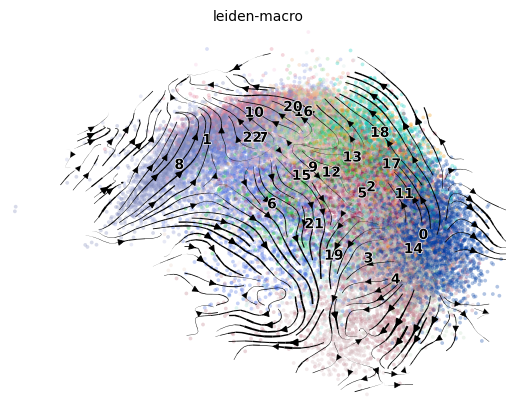

In [9]:
import scanpy as sc
import loompy as lm
import scvelo as scv
import os
import pandas as pd
import numpy as np
# macro_Mye = scv.read('velo-Macro.h5ad')
def clu(adata, key_added, n_neighbors=50, n_pcs=30, rep='X_pca_harmony', do_har=False, max_iter=20, resolution=1, do_scrublet=True, har_key='batch'):
    # Computing the neighborhood graph
    if do_scrublet:
        n0 = adata.shape[0]
        print("{0} Cell number: {1}".format(key_added, n0))
        sc.external.pp.scrublet(adata, random_state=112)
        adata = adata[adata.obs['predicted_doublet']==False,:].copy()
        print("{0} Cells retained after scrublet, {1} cells reomved.".format(adata.shape[0], n0-adata.shape[0]))
    else:
        print("Ignoring processing doublet cells...")
    sc.tl.pca(adata, svd_solver='arpack')
    if do_har:
        sc.external.pp.harmony_integrate(adata, key='batch',max_iter_harmony=max_iter)
    sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata, key_added=key_added, resolution=resolution)
    sc.pl.umap(adata, color=key_added, legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
    return adata
# macro_Mye = clu(macro_Mye, key_added='leiden-macro', do_har=True, do_scrublet=False, rep='X_pca_harmony')
scv.pp.filter_and_normalize(macro_Mye)
scv.pp.pca(macro_Mye, n_comps=50)
scv.pp.neighbors(macro_Mye, n_pcs=30, use_rep='X_pca_harmony')
scv.pp.moments(macro_Mye, n_pcs=30, n_neighbors=30, use_rep='X_pca_harmony')
scv.tl.velocity(macro_Mye,  mode='stochastic')
scv.tl.velocity_graph(macro_Mye, n_jobs=16)
scv.tl.umap(macro_Mye)
sc.tl.leiden(macro_Mye, key_added="leiden-macro", resolution=0.5)
scv.pl.velocity_embedding_stream(macro_Mye, basis='umap', color="leiden-macro")

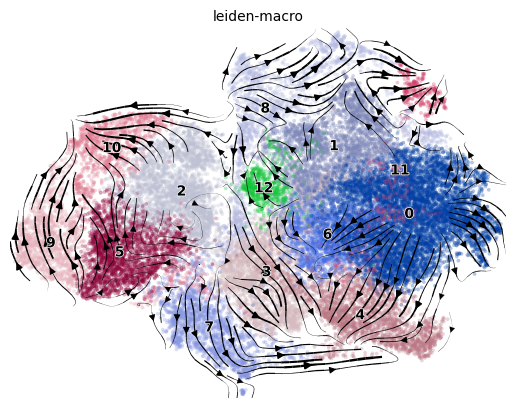

In [47]:
sc.tl.leiden(macro_Mye, key_added="leiden-macro", resolution=0.5)
scv.pl.velocity_embedding_stream(macro_Mye, basis='umap', color="leiden-macro")

In [48]:
scv.tl.rank_velocity_genes(macro_Mye, groupby='leiden-macro', min_corr=.3)

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


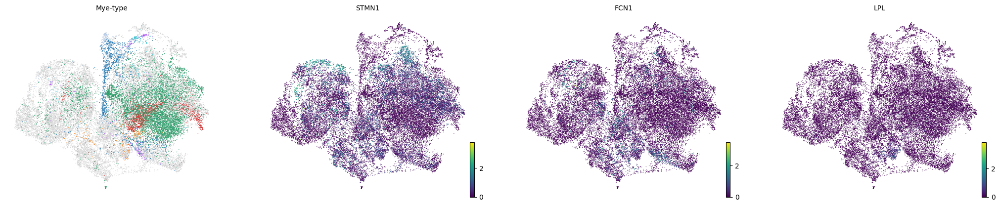

In [46]:
scv.pl.umap(macro_Mye, color=['Mye-type', 'STMN1', 'FCN1','LPL'])

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


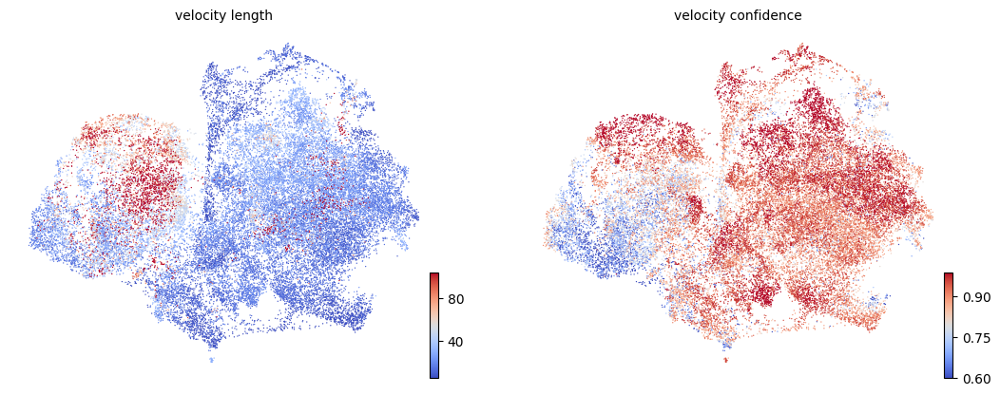

In [51]:
scv.tl.velocity_confidence(macro_Mye)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(macro_Mye, c=keys, cmap='coolwarm', perc=[5, 95])

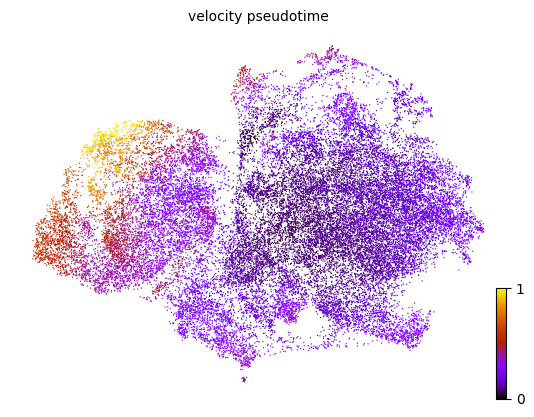

In [38]:
scv.tl.velocity_pseudotime(macro_Mye)
scv.pl.scatter(macro_Mye, color='velocity_pseudotime', cmap='gnuplot')

recovering dynamics (using 16/96 cores)


  0%|          | 0/746 [00:00<?, ?gene/s]

    finished (0:07:07) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:01:51) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/96 cores)


  0%|          | 0/32484 [00:00<?, ?cells/s]

    finished (0:00:38) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:10) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


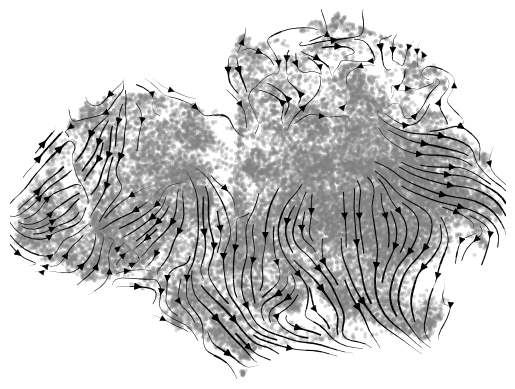

NameError: name 'adata' is not defined

In [53]:
scv.tl.recover_dynamics(macro_Mye, n_jobs=16)
scv.tl.velocity(macro_Mye, mode='dynamical')
scv.tl.velocity_graph(macro_Mye)

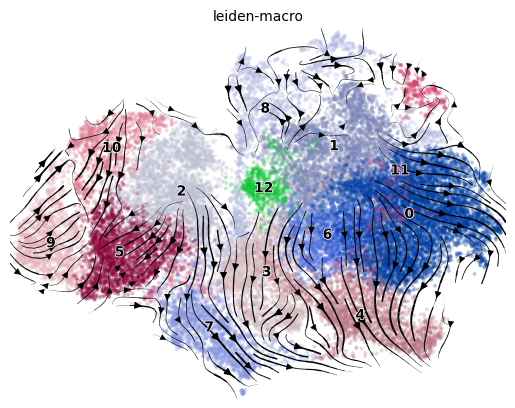

computing latent time using root_cells as prior
    finished (0:01:36) --> added 
    'latent_time', shared time (adata.obs)


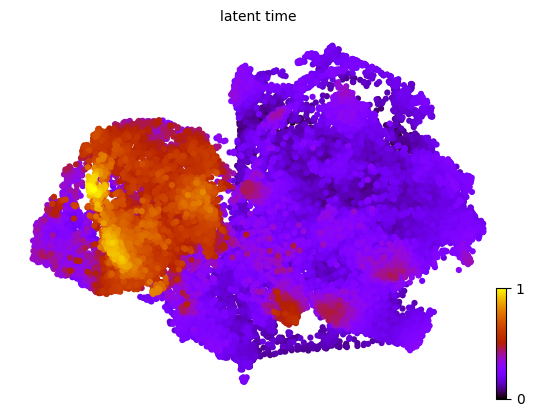

In [54]:
scv.pl.velocity_embedding_stream(macro_Mye, basis='umap', color='leiden-macro')
scv.tl.latent_time(macro_Mye)
scv.pl.scatter(macro_Mye, color='latent_time', color_map='gnuplot', size=80)

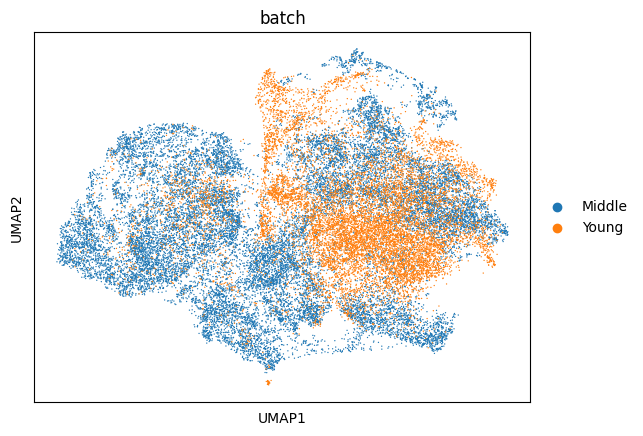

In [21]:
sc.pl.umap(macro_Mye, color='batch')

In [15]:
?sc.external.tl.harmony_timeseries

Signature:
sc.external.tl.harmony_timeseries(
    adata: anndata._core.anndata.AnnData,
    tp: str,
    n_neighbors: int = 30,
    n_components: Optional[int] = 1000,
    n_jobs: int = -2,
    copy: bool = False,
) -> Optional[anndata._core.anndata.AnnData]
Docstring:
Harmony time series for data visualization with augmented affinity matrix
at discrete time points [Nowotschin18i]_.

Harmony time series is a framework for data visualization, trajectory
detection and interpretation for scRNA-seq data measured at discrete
time points. Harmony constructs an augmented affinity matrix by augmenting
the kNN graph affinity matrix with mutually nearest neighbors between
successive time points. This augmented affinity matrix forms the basis for
generated a force directed layout for visualization and also serves as input
for computing the diffusion operator which can be used for trajectory
detection using Palantir_.

.. _Palantir: https://github.com/dpeerlab/Palantir

.. note::
   More informati

In [42]:
ldata_Mye.write_h5ad("ldata-Fmye.h5ad")

Normalized count data: X, spliced, unspliced.
Logarithmized X.
computing neighbors


/home/rzh/BCY/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


    finished (0:00:40) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:13) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:37) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 16/96 cores)


  0%|          | 0/16264 [00:00<?, ?cells/s]

    finished (0:01:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


ValueError: color key is invalid! pass valid observation annotation or a gene name

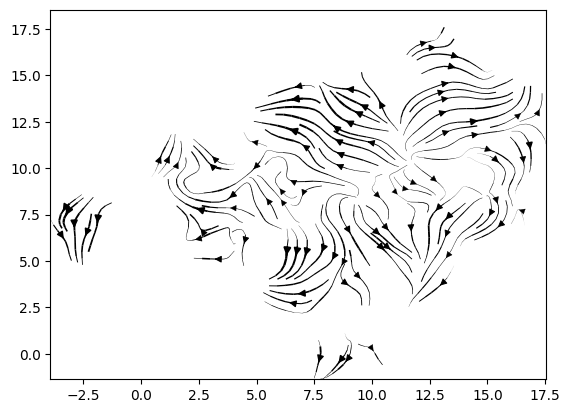

In [37]:
scv.pp.filter_and_normalize(ldata_Mye)
scv.pp.neighbors(ldata_Mye, n_pcs=30, use_rep='X_pca')
scv.pp.moments(ldata_Mye, n_pcs=30, n_neighbors=30, use_rep='X_pca')
scv.tl.velocity(ldata_Mye,  mode='stochastic')
scv.tl.velocity_graph(ldata_Mye, n_jobs=16)
scv.tl.umap(ldata_Mye)


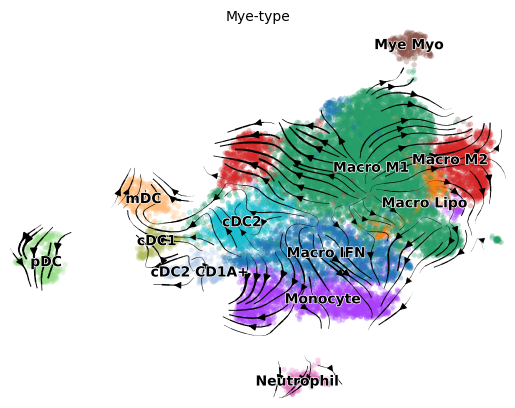

In [38]:
scv.pl.velocity_embedding_stream(ldata_Mye, basis='umap', color="Mye-type")

In [ ]:
scv.pl.velocity_embedding_stream(ldata1, basis='umap', color="majorType-Female")

In [4]:
adata_MyeRef = sc.read_h5ad("adata-Fmye.h5ad")
adata_MyeRef.obs['sample'] = [s.split('-')[2] for s in adata_MyeRef.obs_names]
adata_MyeRef = adata_MyeRef[adata_MyeRef.obs['sample'].isin(preDict)]
adata_MyeRef.obs_names = [s.split('-')[0] + '-1-' + adata_MyeRef.obs.loc[s, 'sample'] for s in adata_MyeRef.obs_names]
adata_MyeRef.obs_names

Index(['AAACCCAGTAAGGCCA-1-1T', 'AAAGAACTCGCACGGT-1-1T',
       'AACAAGATCCCTTCCC-1-1T', 'AACAGGGTCGACCCAG-1-1T',
       'AACCATGAGTCGCGAA-1-1T', 'AACCCAAGTACAACGG-1-1T',
       'AAGACAATCTTGATTC-1-1T', 'AAGACTCAGGAACGCT-1-1T',
       'AAGACTCCATCTCCCA-1-1T', 'AAGCATCGTACGGTTT-1-1T',
       ...
       'GTCAAGTCAACACCTA-1-22T', 'GTGCAGCAGTGGAGAA-1-22T',
       'TACAGTGCACATTAGC-1-22T', 'TACGGGCGTTCGAATC-1-22T',
       'TACTTACGTCTCTCTG-1-22T', 'TCTGAGAAGTTAACGA-1-22T',
       'TGCCCTACACCTCGTT-1-22T', 'TGGTTCCGTCAGTGGA-1-22T',
       'TGTGGTACAACCGCCA-1-22T', 'TTATGCTGTAGCCTCG-1-22T'],
      dtype='object', length=16525)

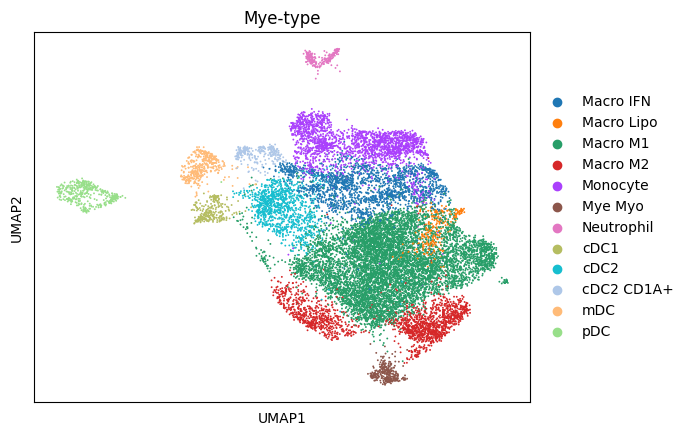

In [15]:
adata_Mye = adata_MyeRef
adata_Mye.obs['Mye-type']=list(adata_Mye.obs['Mye-type'])
adata_Mye.obs.loc[adata_Mye.obs['Mye-type']=="cDC1", 'Mye-type']="DC"
adata_Mye.obs.loc[adata_Mye.obs['Mye-type']=="mDC", 'Mye-type']="cDC1"
adata_Mye.obs.loc[adata_Mye.obs['Mye-type']=="DC", 'Mye-type']="mDC"
sc.pl.umap(adata_Mye, color="Mye-type")

In [16]:
sc.write("adata-Fmye.h5ad", adata_Mye)

In [3]:
adata_Mye = sc.read_h5ad("adata-Fmye.h5ad")
bdata_Mye = sc.read_h5ad("BCM-Mye.h5ad")

In [4]:
common_vars = pd.unique(adata_Mye.var_names.intersection(bdata_Mye.var_names))
adata_Mye.obs['major-type']="Myeloid"
bdata_Mye.obs['Mye-type']="Myeloid"
adata_Mye = adata_Mye[:, common_vars]
bdata_Mye.var_names_make_unique()
bdata_Mye = bdata_Mye[:, common_vars]
bdata_Mye.obs = bdata_Mye.obs.loc[:, ['batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts',
       'doublet_score', 'major-type']]
bdata_Mye.obs = bdata_Mye.obs.loc[:, ['batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts',
       'doublet_score', 'major-type']]
adata_Mye.var = adata_Mye.var.loc[:, ['n_cells_by_counts', 'mean_counts', 'log1p_mean_counts',
       'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts',
       'n_cells', 'highly_variable', 'means', 'dispersions',
       'dispersions_norm']]
bdata_Mye.var = bdata_Mye.var.loc[:, ['n_cells_by_counts', 'mean_counts', 'log1p_mean_counts',
       'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts',
       'n_cells', 'highly_variable', 'means', 'dispersions',
       'dispersions_norm']]
bdata_Mye.obs['sample']=bdata_Mye.obs['batch']
adata_Mye.uns = {}
bdata_Mye.uns={}
data_Mye = adata_Mye.concatenate(bdata_Mye, batch_categories=['Young', 'Middle'])
# sc.write("adata-allMyeloid.h5ad", data_Mye)

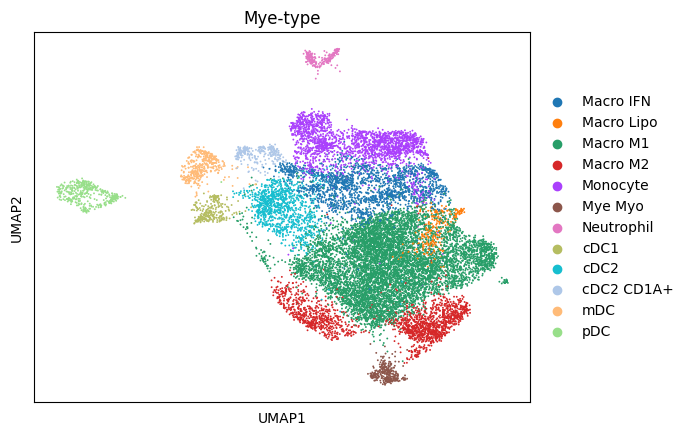

In [7]:
sc.pl.umap(adata_Mye, color='Mye-type')# mDC and cDC1 reverse

Ignoring processing doublet cells...


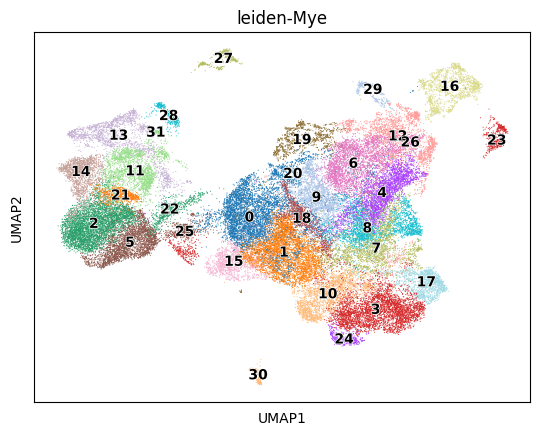

KeyboardInterrupt: 

In [6]:
data_Mye = clu(data_Mye, do_har=True, do_scrublet=False, key_added='leiden-Mye', rep='X_pca_harmony', resolution=1, har_key='batch')
data_Mye = marker(data_Mye, groupby='leiden-Mye', prefix='allMye')

In [ ]:
sc.external.pp.harmony_integrate(data_Mye, key='sample',max_iter_harmony=20)

2024-02-22 15:50:30,647 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


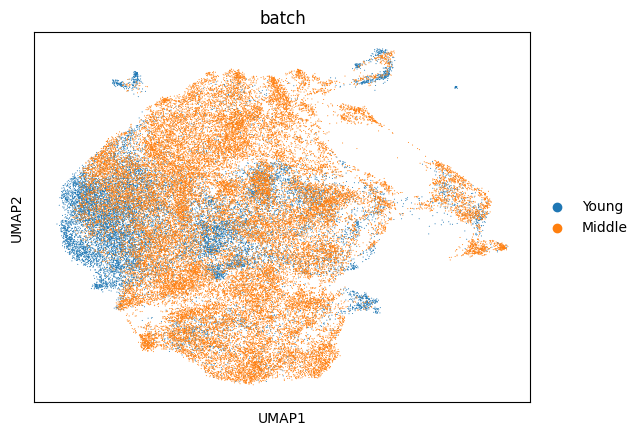

In [165]:
sc.pl.umap(data_Mye, color='batch')

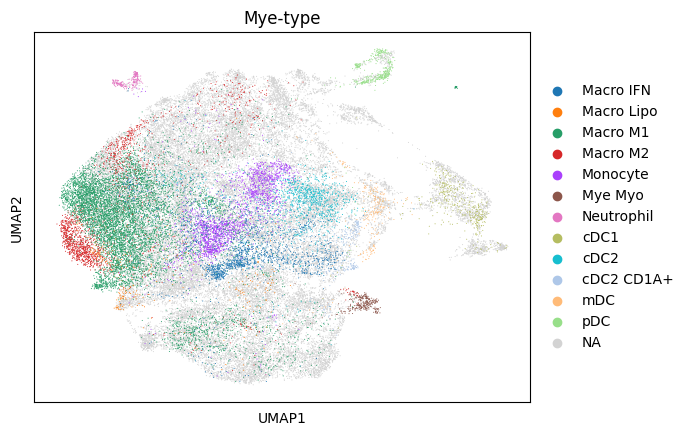

In [166]:
sc.pl.umap(data_Mye, color='Mye-type')

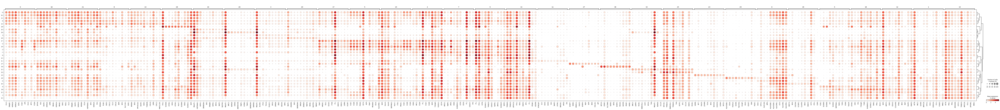

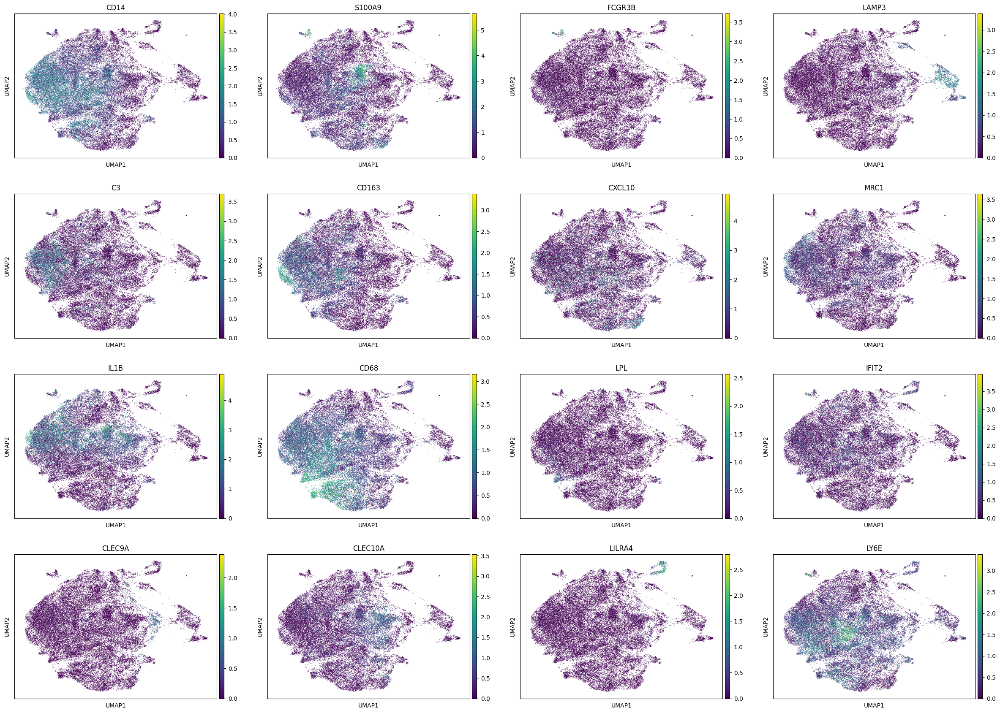

In [169]:
sc.pl.umap(data_Mye, color=['CD14','S100A9', 'FCGR3B', 'LAMP3', 'C3', 'CD163', 'CXCL10', 
                              'MRC1', 'IL1B', 'CD68', 'LPL', 'IFIT2','CLEC9A', 'CLEC10A', 'LILRA4', 'LY6E'])

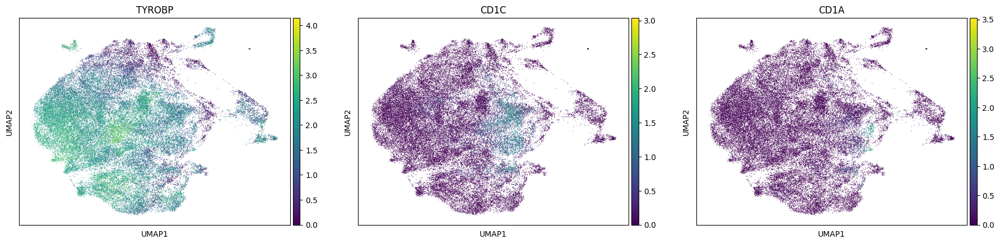

In [188]:
sc.pl.umap(data_Mye, color=['TYROBP', 'CD1C', 'CD1A'])

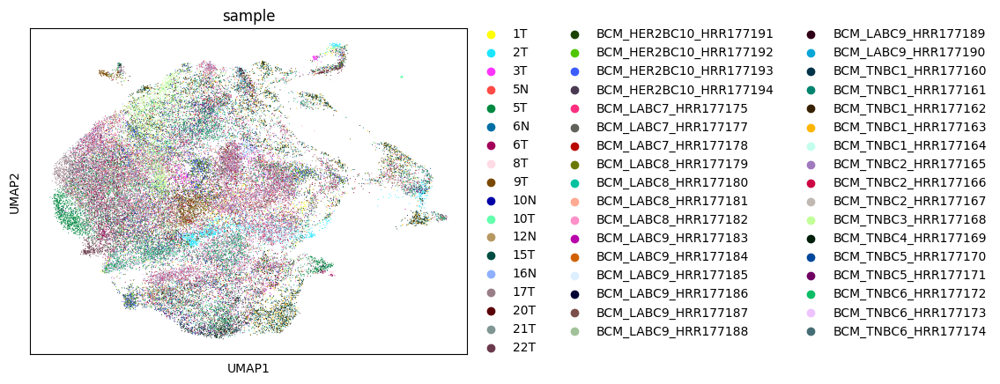

In [177]:
sc.pl.umap(data_Mye, color=['sample'])

In [7]:
def clu(adata, key_added, n_neighbors=50, n_pcs=30, rep='X_pca_harmony', do_har=False, max_iter=20, resolution=1, do_scrublet=True, har_key='batch'):
    # Computing the neighborhood graph
    if do_scrublet:
        n0 = adata.shape[0]
        print("{0} Cell number: {1}".format(key_added, n0))
        sc.external.pp.scrublet(adata, random_state=112)
        adata = adata[adata.obs['predicted_doublet']==False,:].copy()
        print("{0} Cells retained after scrublet, {1} cells reomved.".format(adata.shape[0], n0-adata.shape[0]))
    else:
        print("Ignoring processing doublet cells...")
    sc.tl.pca(adata, svd_solver='arpack')
    if do_har:
        sc.external.pp.harmony_integrate(adata, key='batch',max_iter_harmony=max_iter)
    sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata, key_added=key_added, resolution=resolution)
    sc.pl.umap(adata, color=key_added, legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
    return adata

def marker(adata, groupby, method='wilcoxon', prefix=''):
    sc.tl.rank_genes_groups(adata, groupby = groupby, method = method)
    sc.tl.dendrogram(adata, groupby=groupby, use_rep='X_pca_harmony')
    sc.pl.rank_genes_groups_dotplot(adata, groupby = groupby, save=prefix+groupby+'.svg')
    return adata

In [122]:
def MergeSubAdata(adata, subAdata, obsName, subObsName):
    obs = pd.Series(list(adata.obs[obsName].copy()), index=adata.obs_names)
    subObs = pd.Series(list(subAdata.obs[subObsName].copy()), index=subAdata.obs_names)
    obs.loc[subObs.index] = subObs
    return pd.DataFrame(obs, columns=[obsName])

View of AnnData object with n_obs × n_vars = 16525 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'leiden-B', 'leiden-Mye', 'Mye-type', 'sample'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Mye-type_colors', 'dendrogram_leiden-Mye', 'leiden', 'leiden-Mye_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [152]:
'TTTGCGCAGCGATCCC-1-9T' in adata_MyeRef.obs_names

False